**SCM_MGMT 661**

**Topic Modeling Exercise**



*   LDA (Latent Dirichlet Allocation)
*   NMF (Non-negative Matrix Factorization)
*   LSA (Latent Semantic Analysis)
*   BERTopic (Bidirectional Encoder Representations from Transformers Topic)

Instructor: Indika Dissanayake






In [ ]:
# Import libraries
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF, TruncatedSVD


In [ ]:
# Download required NLTK data
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
# import Ashville listing datasets
reviews_url = 'https://data.insideairbnb.com/united-states/nc/asheville/2024-06-21/data/reviews.csv.gz'

# Load the datasets into DataFrames
reviews_df = pd.read_csv(reviews_url, compression='gzip')



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:

# Display the first few rows of each dataset
reviews_df.head()


,listing_id,id,date,reviewer_id,reviewer_name,comments
0,155305,409437,2011-07-31,844309,Jillian,We had a wonderful time! The cottage was very ...
1,155305,469775,2011-08-23,343443,Katie,Place was great! Can't really speak to the ins...
2,155305,548257,2011-09-19,1152025,Katie,We had a great time! The cabin was nice and a...
3,155305,671470,2011-10-28,1245885,Jason,Clean and comfortable room with everything you...
4,155305,1606327,2012-07-01,1891395,Craig,The cabin was solid for an overnight stay. It ...


**Data Pre-Processing**

In [ ]:
# pre- processing function

# Initialize lemmatizer
lemmatizer = WordNetLemmatizer()

# Define custom stopwords
custom_stopwords = {'asheville', 'airbnb', 'host','love','wonderful','good'}  # Add any custom words you want to filter out

# Define the preprocessing function
def preprocess_text(text):
    if pd.isnull(text):
        return ''
    # Remove URLs, non-letters, and convert to lowercase
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    text = text.lower()

    # Tokenize and remove stopwords
    tokens = text.split()
    stop_words = set(stopwords.words('english')).union(custom_stopwords)

    # Lemmatize and remove stopwords
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words and word not in string.punctuation]

    return ' '.join(tokens)

In [ ]:
# pre-process comments
reviews_df['cleaned_comments'] = reviews_df['comments'].apply(preprocess_text)

In [ ]:
reviews_df.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,cleaned_comments
0,155305,409437,2011-07-31,844309,Jillian,We had a wonderful time! The cottage was very ...,time cottage comfortable although bed could us...
1,155305,469775,2011-08-23,343443,Katie,Place was great! Can't really speak to the ins...,place great cant really speak inside went insi...
2,155305,548257,2011-09-19,1152025,Katie,We had a great time! The cabin was nice and a...,great time cabin nice great value people frien...
3,155305,671470,2011-10-28,1245885,Jason,Clean and comfortable room with everything you...,clean comfortable room everything need short s...
4,155305,1606327,2012-07-01,1891395,Craig,The cabin was solid for an overnight stay. It ...,cabin solid overnight stay bit smaller appeare...


In [ ]:

# Ensure the 'date' column is in datetime format
reviews_df['date'] = pd.to_datetime(reviews_df['date'], errors='coerce')

# Filter pre-pandemic (2019) and post-pandemic (2023) reviews
pre_pandemic_reviews = reviews_df[(reviews_df['date'] >= '2019-01-01') & (reviews_df['date'] <= '2019-12-31')]
post_pandemic_reviews = reviews_df[(reviews_df['date'] >= '2023-01-01') & (reviews_df['date'] <= '2023-12-31')]



In [ ]:
# Let's check the shape of the dataframes
print(pre_pandemic_reviews.shape)
print(post_pandemic_reviews.shape)



(35902, 7)
(65409, 7)


In [ ]:
# Define functions to create plots

import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud

# Function to plot the top words for each topic
def plot_top_words(model, feature_names, n_top_words=10, title='Top words per topic'):
    fig, axes = plt.subplots(1, model.n_components, figsize=(15, 5), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]
        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f'Topic {topic_idx+1}', fontdict={'fontsize': 10})
        ax.invert_yaxis()
        ax.tick_params(axis='both', which='major', labelsize=10)
    plt.suptitle(title, fontsize=12)
    plt.subplots_adjust(top=0.85, wspace=0.3)
    plt.show()


# Function to generate word clouds for each topic
def plot_word_clouds(model, feature_names, n_top_words=30):
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = {feature_names[i]: topic[i] for i in top_features_ind}
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_features)
        plt.figure()
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Topic {topic_idx+1} Word Cloud', fontsize=16)
        plt.show()

**LDA**

In [ ]:
# Topic Modeling with LDA

# Vectorize the cleaned comments
vectorizer = CountVectorizer(max_df=0.9, min_df=5, stop_words='english')
X = vectorizer.fit_transform(pre_pandemic_reviews['cleaned_comments'])   # This analysis is for the pre-pandemic period. Change the DataFrame to "post_pandemic_reviews" when analyzing post-pandemic reviews

# Set the number of topics
n_topics = 10

# Create and fit the LDA model
lda_model_pre = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda_model_pre.fit(X)

# Extract the top words from each topic
terms = vectorizer.get_feature_names_out()
lda_topics = {}

for index, topic in enumerate(lda_model_pre.components_):
    top_words = [terms[i] for i in topic.argsort()[-10:]]  # Get the top 10 words per topic
    lda_topics[f"Topic {index+1}"] = top_words

# Print the LDA topics
print("LDA Topics:")
for topic, words in lda_topics.items():
    print(f"{topic}: {', '.join(words)}")



LDA Topics:
Topic 1: perfect, close, location, super, clean, downtown, stay, easy, great, place
Topic 2: downtown, amazing, great, close, definitely, recommend, home, perfect, stay, place
Topic 3: door, parking, little, issue, bit, noise, place, didnt, nice, night
Topic 4: stay, west, brewery, place, distance, walking, location, downtown, restaurant, great
Topic 5: nice, minute, mountain, porch, place, downtown, beautiful, house, view, great
Topic 6: bed, home, neighborhood, space, apartment, river, district, house, downtown, art
Topic 7: home, place, bathroom, space, clean, room, comfortable, stay, bed, house
Topic 8: definitely, space, downtown, comfortable, recommend, clean, stay, place, location, great
Topic 9: comfortable, coffee, like, feel, extra, stay, touch, make, place, home
Topic 10: location, local, respond, touch, question, great, clean, place, quick, stay


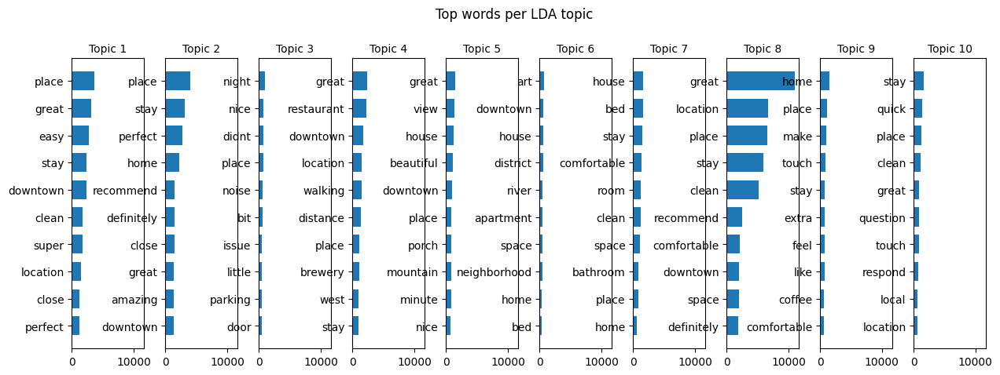

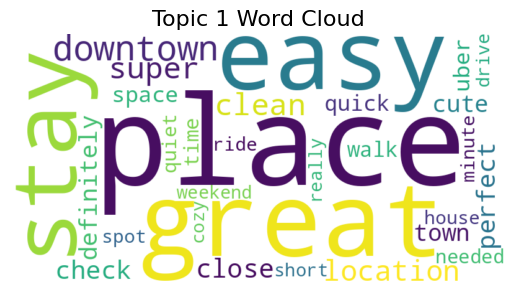

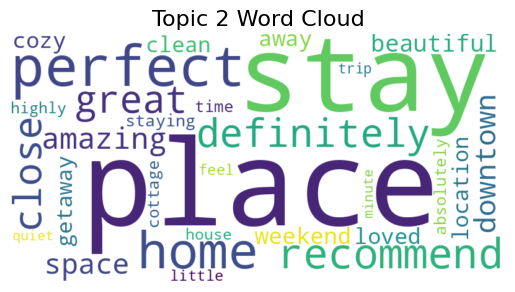

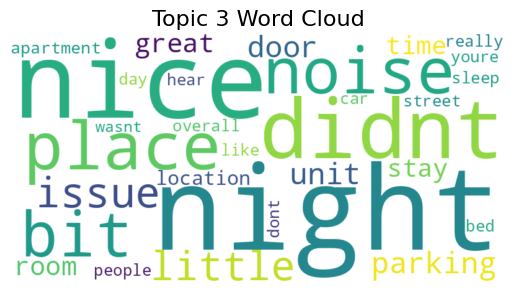

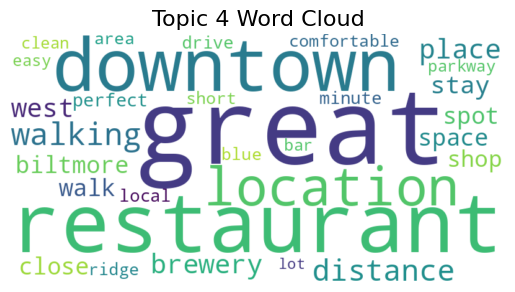

...

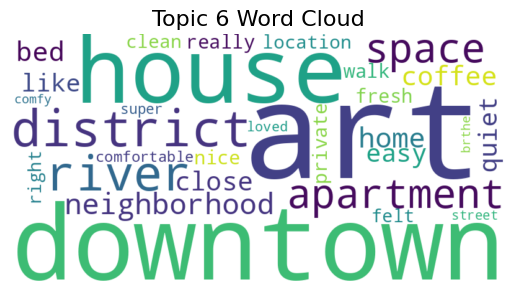

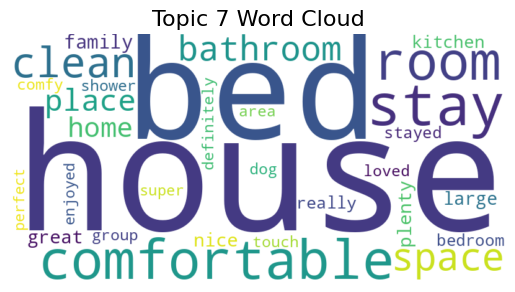

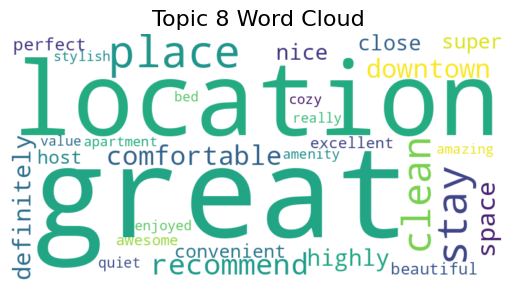

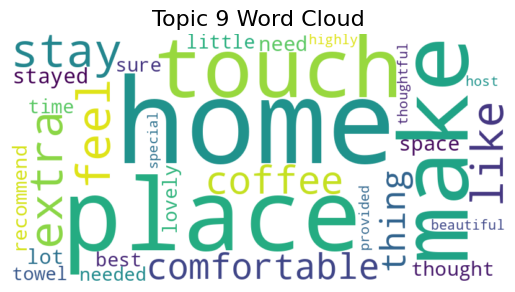

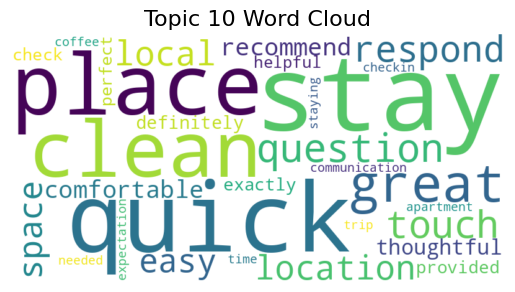

In [ ]:
# LDA topic plots
plot_top_words(lda_model_pre, terms, n_top_words=10, title='Top words per LDA topic')
plot_word_clouds(lda_model_pre, terms)

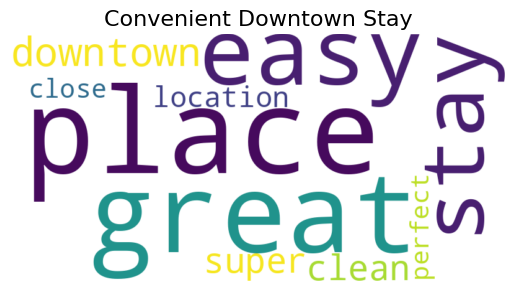

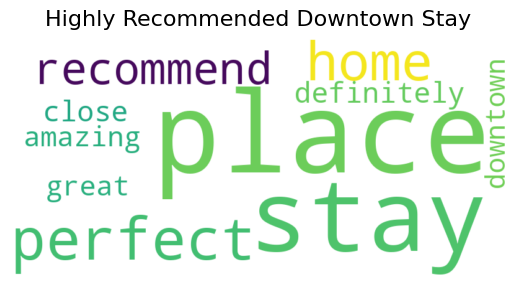

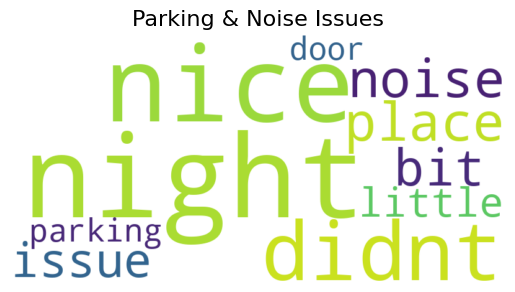

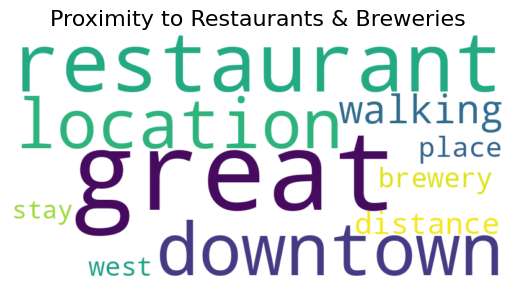

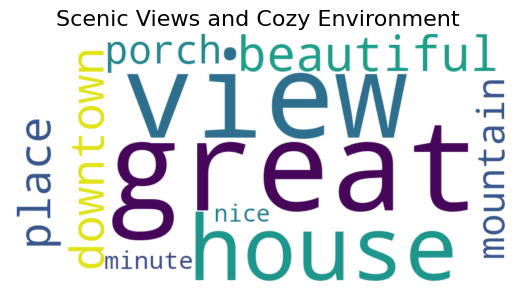

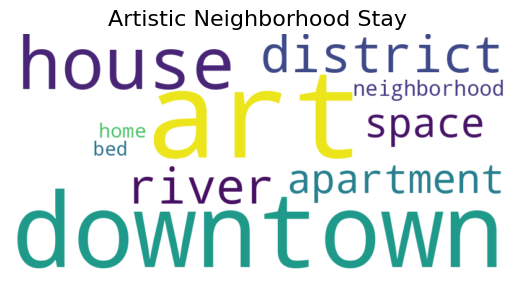

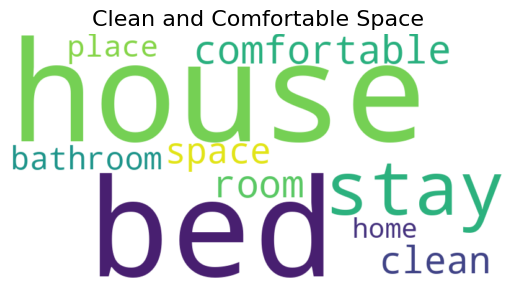

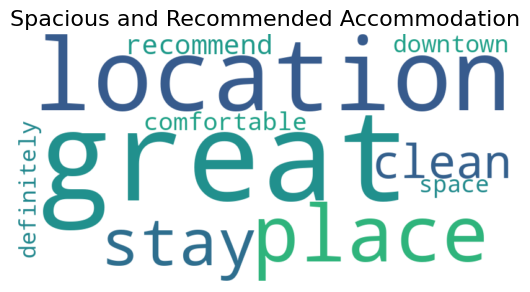

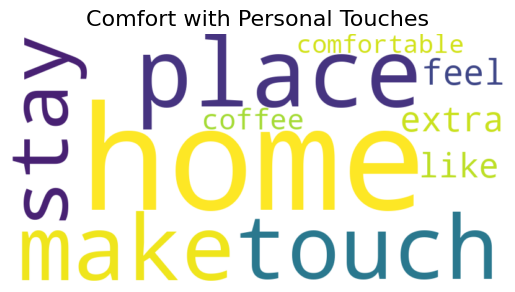

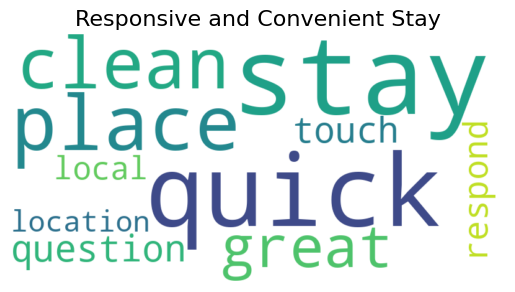

In [ ]:
# Importing libraries
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# D topics with their keywords
topics = {
    "Topic 1": ["perfect", "close", "location", "super", "clean", "downtown", "stay", "easy", "great", "place"],
    "Topic 2": ["downtown", "amazing", "great", "close", "definitely", "recommend", "home", "perfect", "stay", "place"],
    "Topic 3": ["door", "parking", "little", "issue", "bit", "noise", "place", "didnt", "nice", "night"],
    "Topic 4": ["stay", "west", "brewery", "place", "distance", "walking", "location", "downtown", "restaurant", "great"],
    "Topic 5": ["nice", "minute", "mountain", "porch", "place", "downtown", "beautiful", "house", "view", "great"],
    "Topic 6": ["bed", "home", "neighborhood", "space", "apartment", "river", "district", "house", "downtown", "art"],
    "Topic 7": ["home", "place", "bathroom", "space", "clean", "room", "comfortable", "stay", "bed", "house"],
    "Topic 8": ["definitely", "space", "downtown", "comfortable", "recommend", "clean", "stay", "place", "location", "great"],
    "Topic 9": ["comfortable", "coffee", "like", "feel", "extra", "stay", "touch", "make", "place", "home"],
    "Topic 10": ["location", "local", "respond", "touch", "question", "great", "clean", "place", "quick", "stay"],
}

# Creating labels for the topics
topic_labels = [
    "Convenient Downtown Stay",
    "Highly Recommended Downtown Stay",
    "Parking & Noise Issues",
    "Proximity to Restaurants & Breweries",
    "Scenic Views and Cozy Environment",
    "Artistic Neighborhood Stay",
    "Clean and Comfortable Space",
    "Spacious and Recommended Accommodation",
    "Comfort with Personal Touches",
    "Responsive and Convenient Stay"
]

# Function to generate a word cloud for each topic
def plot_word_clouds_with_labels(model, feature_names, labels, n_top_words=10):
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = {feature_names[i]: topic[i] for i in top_features_ind}

        # Create a word cloud for each topic
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_features)
        plt.figure()
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(labels[topic_idx], fontsize=16)  # Use the topic label
        plt.show()


plot_word_clouds_with_labels(lda_model_pre, vectorizer.get_feature_names_out(), topic_labels, n_top_words=10)


###POST PANDEMIC DATA

In [ ]:
# Topic Modeling with LDA

# Vectorize the cleaned comments
vectorizer = CountVectorizer(max_df=0.9, min_df=5, stop_words='english')
X = vectorizer.fit_transform(post_pandemic_reviews['cleaned_comments'])

# Set the number of topics
n_topics = 10

# Create and fit the LDA model
lda_model_post = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda_model_post.fit(X)

# Extract the top words from each topic
terms = vectorizer.get_feature_names_out()
lda_topics = {}

for index, topic in enumerate(lda_model_post.components_):
    top_words = [terms[i] for i in topic.argsort()[-10:]]  # Get the top 10 words per topic
    lda_topics[f"Topic {index+1}"] = top_words

# Print the LDA topics
print("LDA Topics:")
for topic, words in lda_topics.items():
    print(f"{topic}: {', '.join(words)}")



LDA Topics:
Topic 1: location, definitely, quiet, perfect, clean, downtown, close, great, stay, place
Topic 2: porch, quiet, walk, downtown, restaurant, great, neighborhood, place, loved, coffee
Topic 3: stay, place, clean, bedroom, comfortable, room, bathroom, kitchen, nice, bed
Topic 4: loved, tub, hot, stay, great, beautiful, home, family, perfect, house
Topic 5: comfortable, walking, easy, restaurant, place, clean, downtown, stay, location, great
Topic 6: recommend, easy, area, location, downtown, enjoyed, district, river, art, stay
Topic 7: easy, recommend, super, helpful, definitely, clean, responsive, great, place, stay
Topic 8: touch, like, loved, clean, beautiful, felt, comfortable, place, stay, home
Topic 9: experience, feel, stay, staying, great, best, like, stayed, place, time
Topic 10: place, road, car, door, day, didnt, dog, night, house, issue


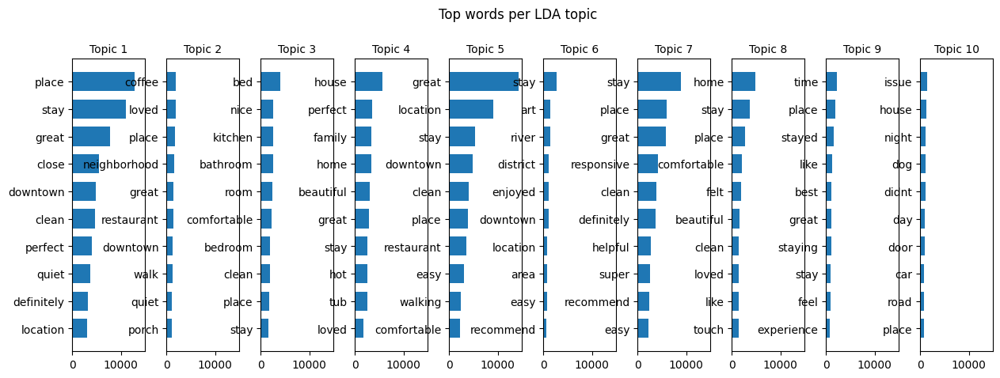

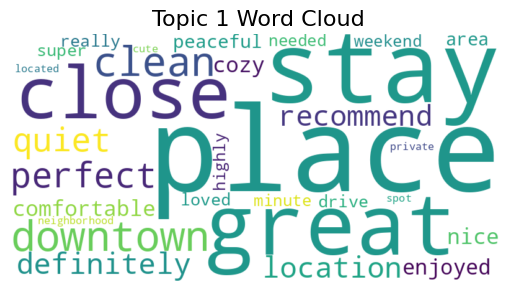

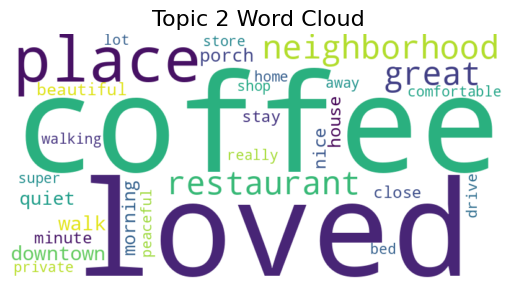

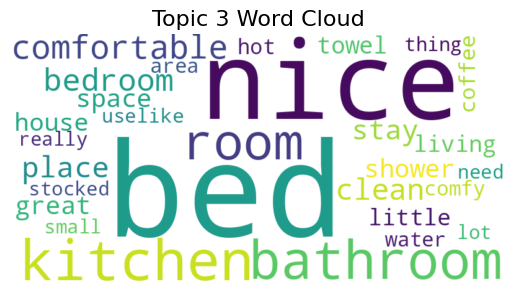

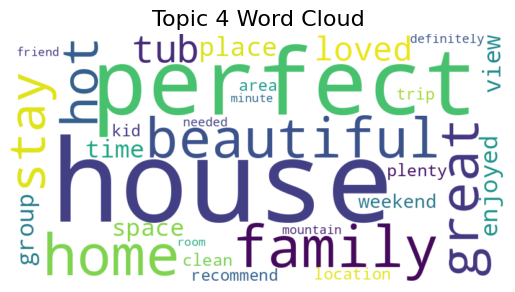

...

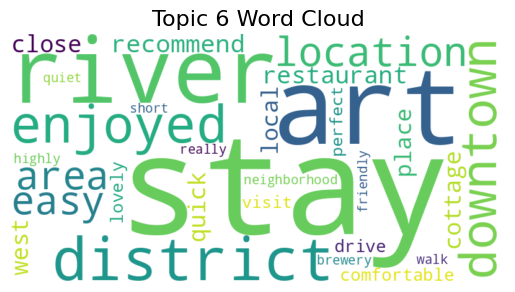

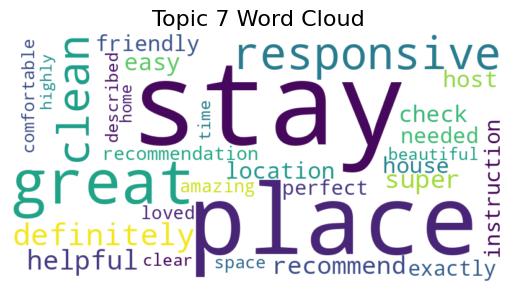

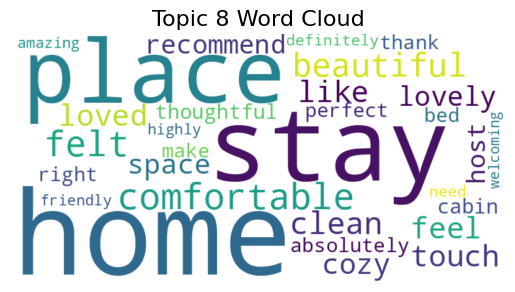

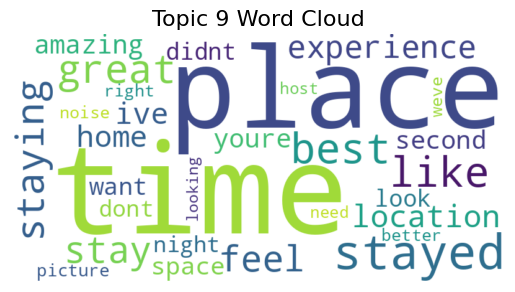

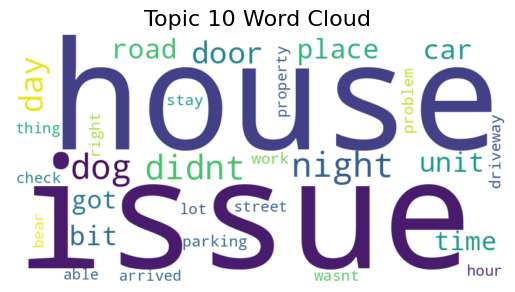

In [ ]:
# LDA topic plots for post pandemic
plot_top_words(lda_model_post, terms, n_top_words=10, title='Top words per LDA topic')
plot_word_clouds(lda_model_post, terms)

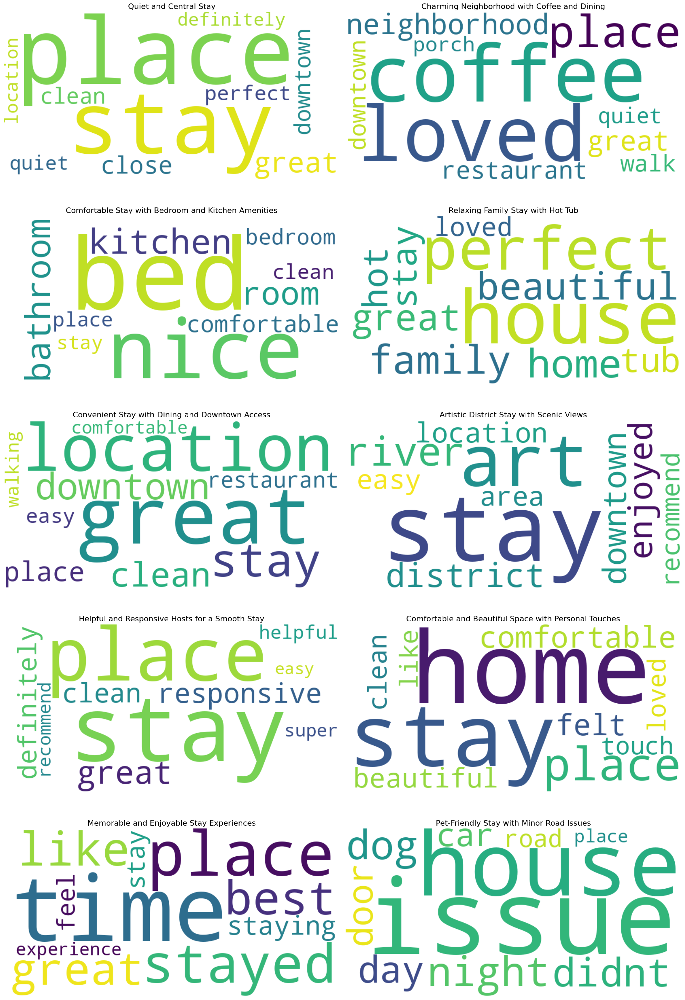

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Ensure plots render inline if using Jupyter Notebook
%matplotlib inline

# Labels for post-pandemic topics
post_pandemic_labels = [
    "Quiet and Central Stay",
    "Charming Neighborhood with Coffee and Dining",
    "Comfortable Stay with Bedroom and Kitchen Amenities",
    "Relaxing Family Stay with Hot Tub",
    "Convenient Stay with Dining and Downtown Access",
    "Artistic District Stay with Scenic Views",
    "Helpful and Responsive Hosts for a Smooth Stay",
    "Comfortable and Beautiful Space with Personal Touches",
    "Memorable and Enjoyable Stay Experiences",
    "Pet-Friendly Stay with Minor Road Issues"
]

# Function to generate word clouds for the post-pandemic topics
def plot_word_clouds_with_labels(model, feature_names, labels, n_top_words=10):
    fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))  # Create a grid for all word clouds
    axes = axes.flatten()  # Flatten the grid to access subplots easily

    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = {feature_names[i]: topic[i] for i in top_features_ind}

        # Create a word cloud for the topic
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_features)

        # Plot in the respective subplot
        axes[topic_idx].imshow(wordcloud, interpolation='bilinear')
        axes[topic_idx].axis('off')
        axes[topic_idx].set_title(labels[topic_idx], fontsize=16)

    plt.tight_layout()  # Adjust layout to avoid overlap
    plt.show()  # Show all plots at once

# Ensure lda_model_post and vectorizer are defined
plot_word_clouds_with_labels(lda_model_post, vectorizer.get_feature_names_out(), post_pandemic_labels, n_top_words=10)


**NMF**

In [ ]:
# Nmf works better with TF-IDF

from sklearn.feature_extraction.text import TfidfVectorizer

# Use TfidfVectorizer to vectorize the cleaned comments
vectorizer = TfidfVectorizer(max_df=0.9, min_df=5, stop_words='english')
X_tfidf = vectorizer.fit_transform(pre_pandemic_reviews['cleaned_comments'])   # This analysis is for the pre-pandemic period. Change the DataFrame to "post_pandemic_reviews" when analyzing post-pandemic reviews

# Create and fit the NMF model
nmf_model_pre = NMF(n_components=n_topics, random_state=42)
nmf_model_pre.fit(X_tfidf)

# Extract the top words from each topic
nmf_topics = {}

for index, topic in enumerate(nmf_model_pre.components_):
    top_words = [terms[i] for i in topic.argsort()[-10:]]  # Get the top 10 words per topic
    nmf_topics[f"Topic {index+1}"] = top_words

# Print the NMF topics
print("NMF Topics:")
for topic, words in nmf_topics.items():
    print(f"{topic}: {', '.join(words)}")

NMF Topics:
Topic 1: mist, harsh, communicate, lead, plentiful, cloth, plumber, concerning, brplenty, comfier
Topic 2: observation, joelle, airbbs, opening, coworker, budget, electrical, mist, pirate, dispenser
Topic 3: concierge, pot, player, gentleman, cast, intended, channel, agreement, appropriate, itbrthe
Topic 4: girl, brwere, abbys, hockey, countless, kimono, ginger, control, choose, monthlong
Topic 5: mike, concerning, channel, cast, kathryns, camping, asks, neck, brwifi, broom
Topic 6: agreement, plentiful, concerning, precarious, cristina, camping, appropriate, countless, intended, gazebo
Topic 7: funeral, planning, pot, opening, agreement, ginger, intended, eliminated, ashlin, echoing
Topic 8: control, gesture, airbbs, hole, ammenities, kathryns, outrageous, liking, kimono, homeowner
Topic 9: cast, ashlin, electrical, narrow, gesture, jonathan, girl, jakub, channel, mikaels
Topic 10: playground, lb, cristina, countless, electrical, knock, choose, moon, ear, knife


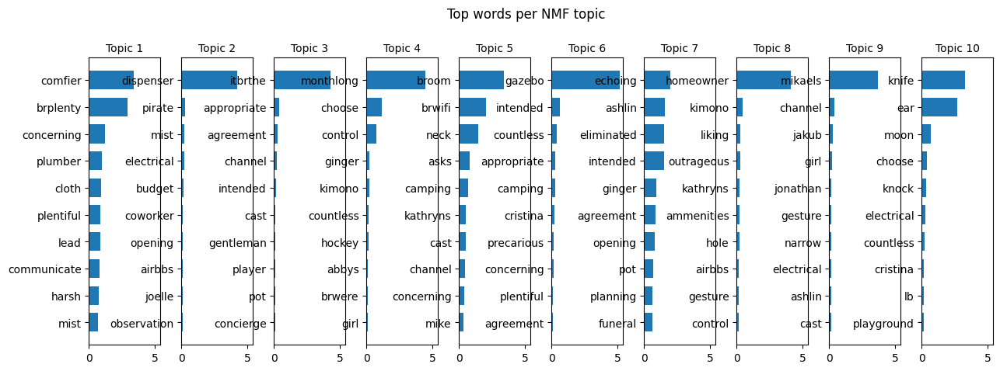

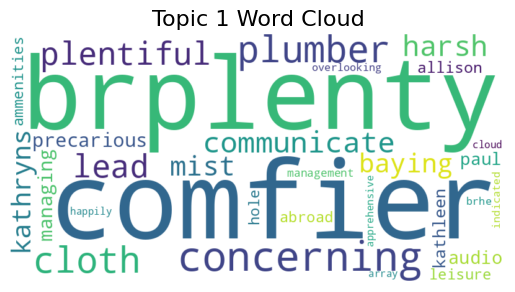

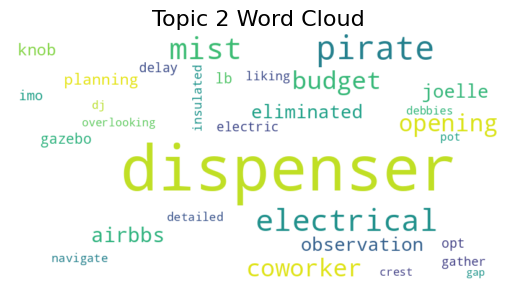

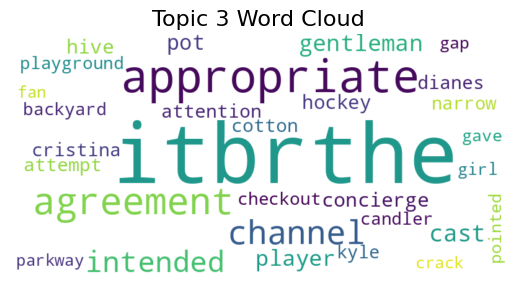

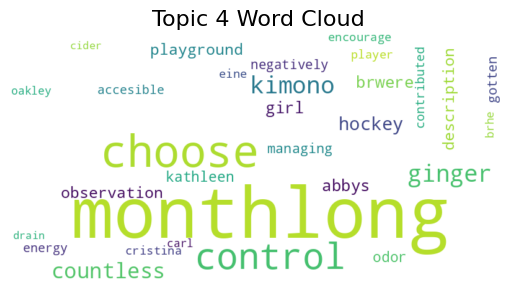

...

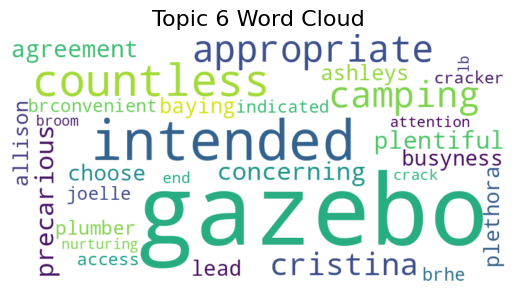

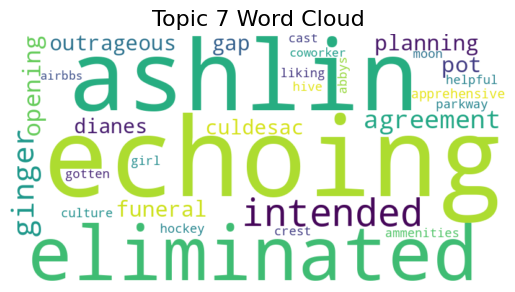

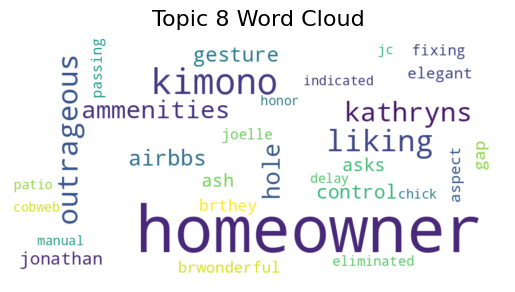

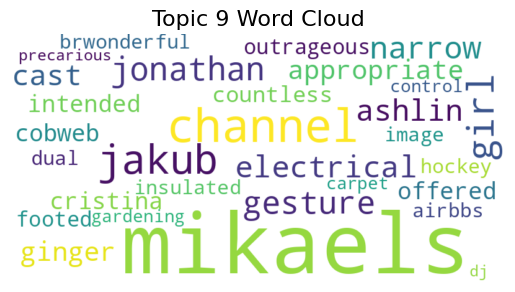

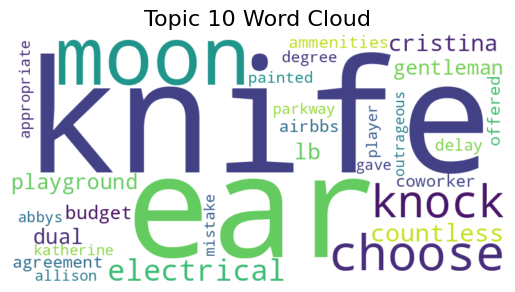

In [ ]:
# NMF topic plots

plot_top_words(nmf_model_pre, terms, n_top_words=10, title='Top words per NMF topic')
plot_word_clouds(nmf_model_pre, terms)

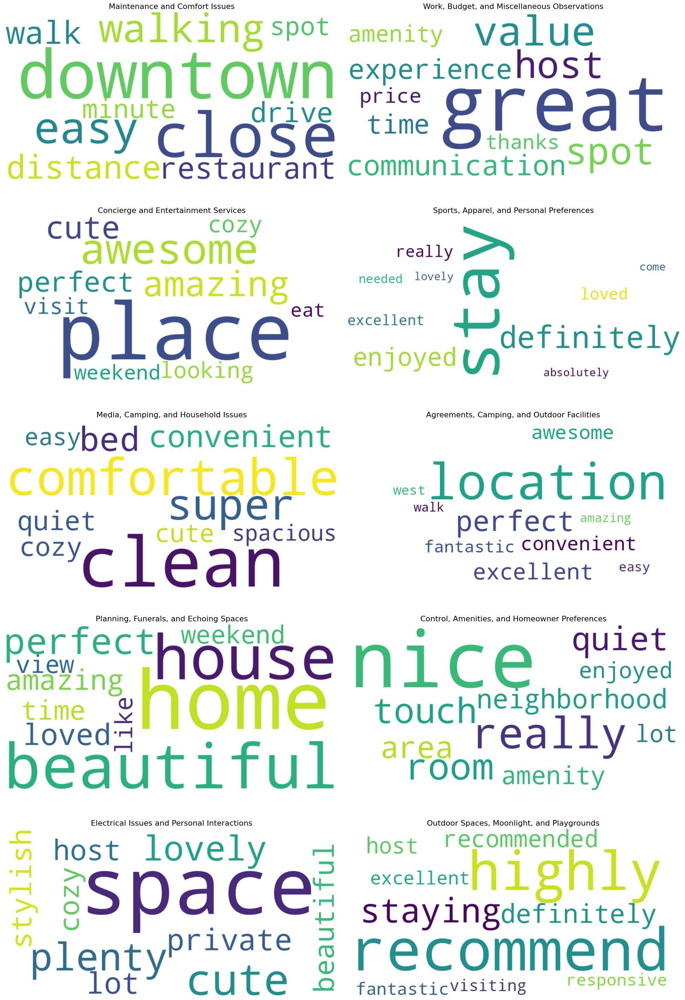

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud


%matplotlib inline

# Labels for NMF topics
nmf_topic_labels = [
    "Maintenance and Comfort Issues",
    "Work, Budget, and Miscellaneous Observations",
    "Concierge and Entertainment Services",
    "Sports, Apparel, and Personal Preferences",
    "Media, Camping, and Household Issues",
    "Agreements, Camping, and Outdoor Facilities",
    "Planning, Funerals, and Echoing Spaces",
    "Control, Amenities, and Homeowner Preferences",
    "Electrical Issues and Personal Interactions",
    "Outdoor Spaces, Moonlight, and Playgrounds"
]

# Function to generate word clouds for NMF topics
def plot_word_clouds_with_labels(model, feature_names, labels, n_top_words=10):
    fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))  # Create a 5x2 grid for word clouds
    axes = axes.flatten()  # Flatten the grid to access subplots easily

    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = {feature_names[i]: topic[i] for i in top_features_ind}


        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_features)

        # Plot in the respective subplot
        axes[topic_idx].imshow(wordcloud, interpolation='bilinear')
        axes[topic_idx].axis('off')
        axes[topic_idx].set_title(labels[topic_idx], fontsize=16)

    plt.tight_layout()
    plt.show()


plot_word_clouds_with_labels(nmf_model_pre, vectorizer.get_feature_names_out(), nmf_topic_labels, n_top_words=10)


### NMF for Post Pandemic Data

In [ ]:


from sklearn.feature_extraction.text import TfidfVectorizer

# Use TfidfVectorizer to vectorize the cleaned comments
vectorizer = TfidfVectorizer(max_df=0.9, min_df=5, stop_words='english')
X_tfidf = vectorizer.fit_transform(post_pandemic_reviews['cleaned_comments'])

# Create and fit the NMF model
nmf_model_post = NMF(n_components=n_topics, random_state=42)
nmf_model_post.fit(X_tfidf)

# Extract the top words from each topic
nmf_topics = {}

for index, topic in enumerate(nmf_model_post.components_):
    top_words = [terms[i] for i in topic.argsort()[-10:]]  # Get the top 10 words per topic
    nmf_topics[f"Topic {index+1}"] = top_words

# Print the NMF topics
print("NMF Topics:")
for topic, words in nmf_topics.items():
    print(f"{topic}: {', '.join(words)}")

NMF Topics:
Topic 1: girl, space, quick, little, needed, trip, spot, getaway, weekend, perfect
Topic 2: responsive, value, thanks, stay, experience, communication, host, spot, time, great
Topic 3: come, absolutely, thanks, lovely, loved, thank, really, definitely, enjoyed, stay
Topic 4: described, peaceful, looking, visit, come, cozy, amazing, awesome, cute, place
Topic 5: area, little, touch, tub, neighborhood, hot, house, quiet, really, nice
Topic 6: parking, condo, amazing, apartment, fantastic, awesome, walkable, excellent, convenient, location
Topic 7: minute, distance, walking, walk, quiet, drive, restaurant, easy, close, downtown
Topic 8: needed, responsive, cute, quiet, cozy, space, bed, super, comfortable, clean
Topic 9: friendly, looking, fantastic, recommended, host, responsive, staying, definitely, highly, recommend
Topic 10: right, like, amazing, view, felt, time, house, loved, beautiful, home


/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


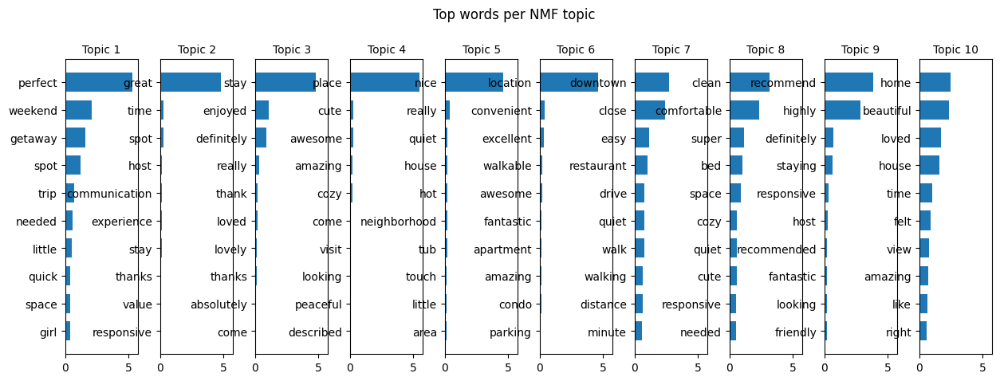

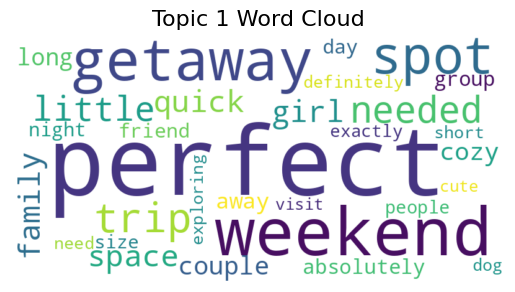

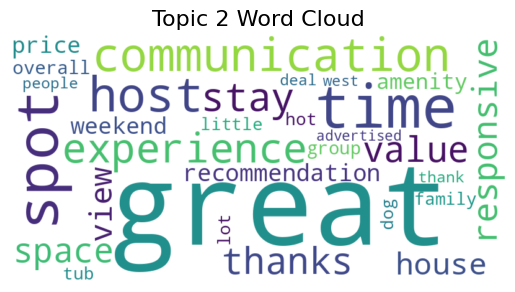

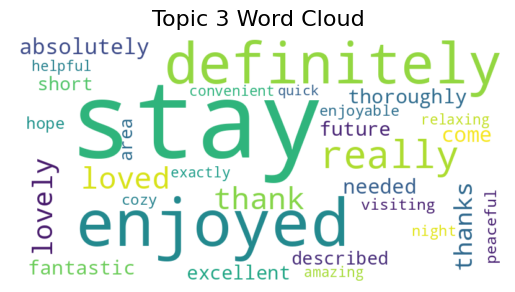

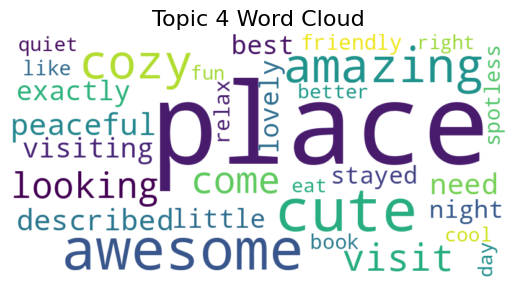

...

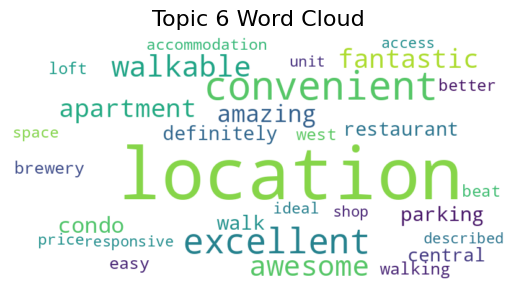

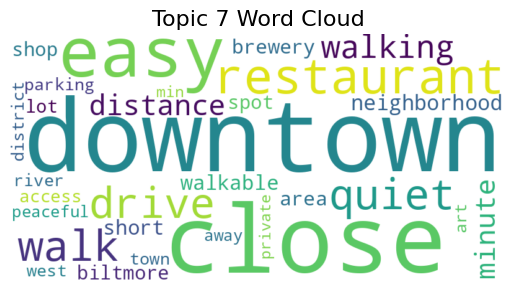

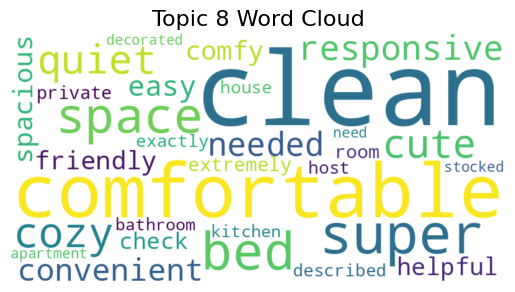

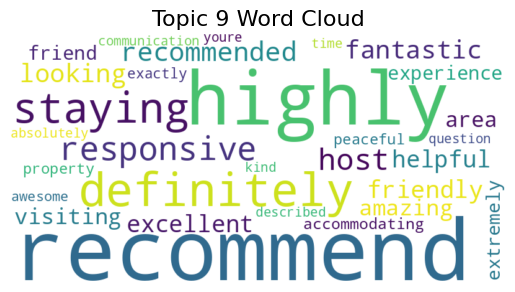

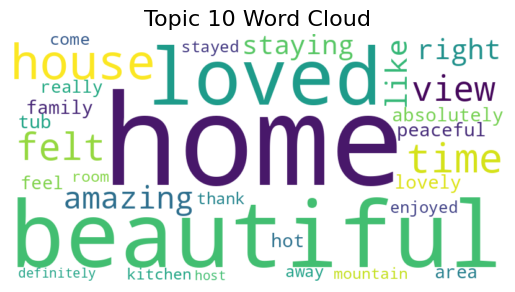

In [ ]:
# NMF topic plots

plot_top_words(nmf_model_post, terms, n_top_words=10, title='Top words per NMF topic')
plot_word_clouds(nmf_model_post, terms)

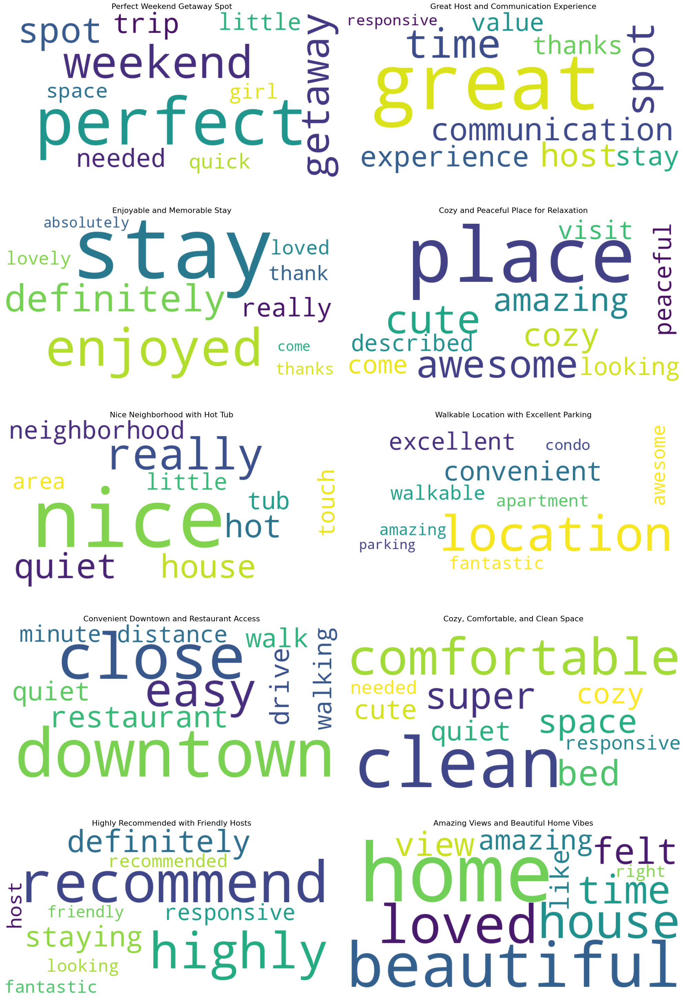

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Ensure plots render inline if using Jupyter Notebook
%matplotlib inline

# Labels for the topics
new_topic_labels = [
    "Perfect Weekend Getaway Spot",
    "Great Host and Communication Experience",
    "Enjoyable and Memorable Stay",
    "Cozy and Peaceful Place for Relaxation",
    "Nice Neighborhood with Hot Tub",
    "Walkable Location with Excellent Parking",
    "Convenient Downtown and Restaurant Access",
    "Cozy, Comfortable, and Clean Space",
    "Highly Recommended with Friendly Hosts",
    "Amazing Views and Beautiful Home Vibes"
]

# Function to generate word clouds for the new topics
def plot_word_clouds_with_labels(model, feature_names, labels, n_top_words=10):
    fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))  # Create a 5x2 grid for word clouds
    axes = axes.flatten()

    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = {feature_names[i]: topic[i] for i in top_features_ind}

        # Creating a word cloud for the topic
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_features)

        # Plotting in the respective subplot
        axes[topic_idx].imshow(wordcloud, interpolation='bilinear')
        axes[topic_idx].axis('off')
        axes[topic_idx].set_title(labels[topic_idx], fontsize=16)

    plt.tight_layout()
    plt.show()
plot_word_clouds_with_labels(nmf_model_post, vectorizer.get_feature_names_out(), new_topic_labels, n_top_words=10)


### LSA for Pre-pandemic data

In [ ]:
vectorizer = TfidfVectorizer(max_df=0.9, min_df=5, stop_words='english')
X_tfidf = vectorizer.fit_transform(pre_pandemic_reviews['cleaned_comments'])
lsa_model_pre = TruncatedSVD(n_components=n_topics, random_state=42)
lsa_model_pre.fit(X_tfidf)
terms = vectorizer.get_feature_names_out()
lsa_topics = {}
for index, topic in enumerate(lsa_model_pre.components_):
    top_words = [terms[i] for i in topic.argsort()[-10:]]  # Get the top 10 words for each topic
    lsa_topics[f"Topic {index+1}"] = top_words
print("LSA Topics:")
for topic, words in lsa_topics.items():
    print(f"{topic}: {', '.join(words)}")

LSA Topics:
Topic 1: definitely, close, perfect, space, downtown, clean, location, stay, place, great
Topic 2: callie, sue, advise, shelly, locationclose, price, value, place, location, great
Topic 3: visiting, located, nice, amazing, close, awesome, enjoyed, definitely, stay, place
Topic 4: amazing, house, loved, beautiful, home, location, space, enjoyed, definitely, stay
Topic 5: convenient, super, enjoyed, bed, space, quiet, comfortable, stay, clean, nice
Topic 6: convenient, perfect, comfortable, amazing, nice, highly, recommend, place, clean, location
Topic 7: getaway, easy, weekend, distance, walking, stay, close, downtown, location, perfect
Topic 8: getaway, view, amazing, house, place, home, beautiful, perfect, location, nice
Topic 9: nice, little, great, loved, place, cute, getaway, weekend, perfect, space
Topic 10: distance, staying, walking, spot, enjoyed, definitely, stay, highly, nice, recommend


**LSA**

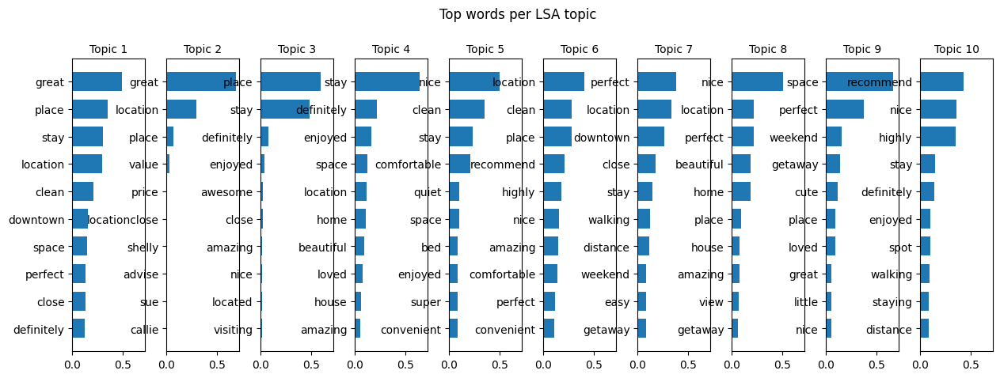

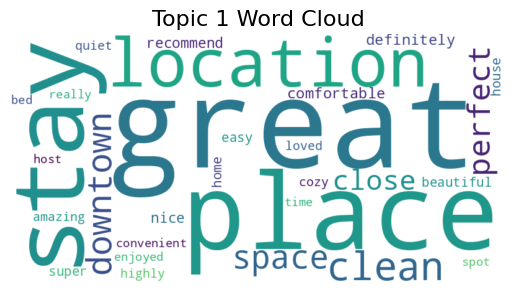

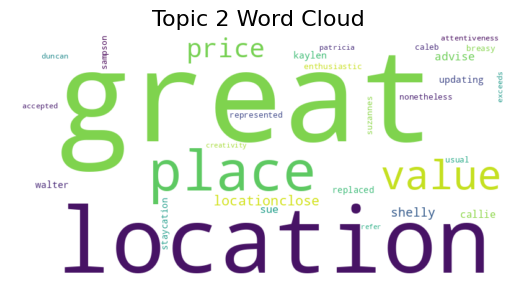

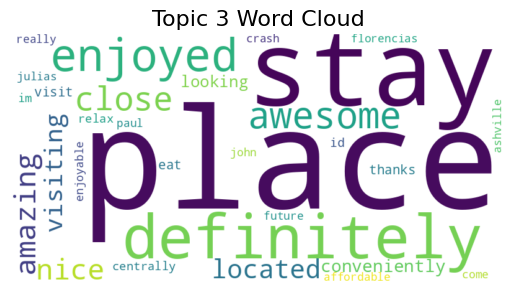

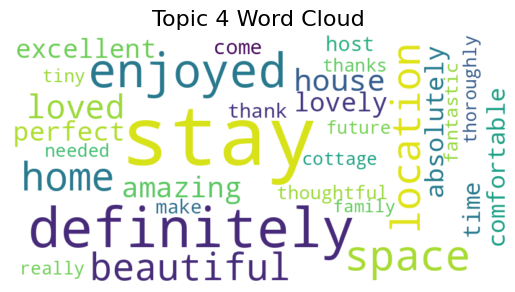

...

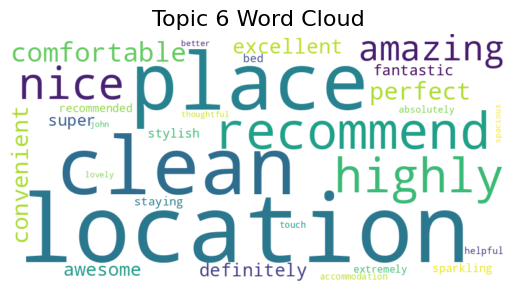

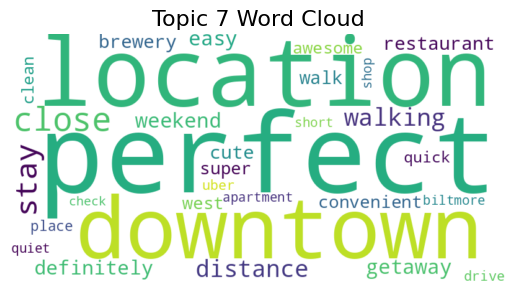

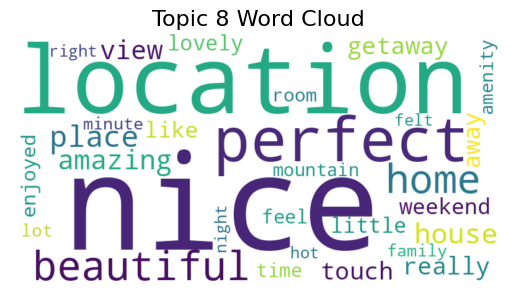

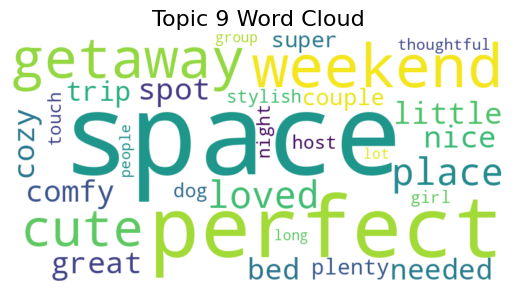

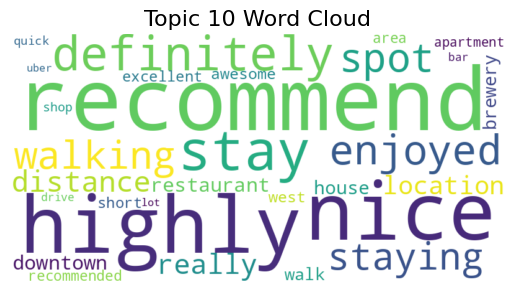

In [ ]:
# LSA Topic Plots
plot_top_words(lsa_model_pre, terms, n_top_words=10, title='Top words per LSA topic')
plot_word_clouds(lsa_model_pre, terms)



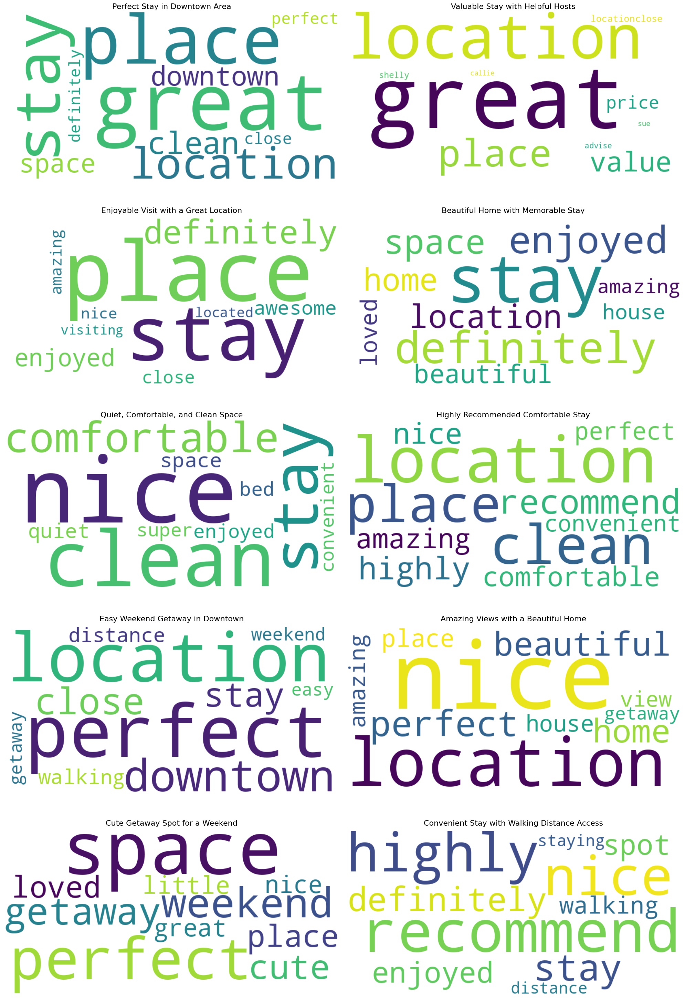

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud


%matplotlib inline

# Labels for LSA topics
lsa_topic_labels = [
    "Perfect Stay in Downtown Area",
    "Valuable Stay with Helpful Hosts",
    "Enjoyable Visit with a Great Location",
    "Beautiful Home with Memorable Stay",
    "Quiet, Comfortable, and Clean Space",
    "Highly Recommended Comfortable Stay",
    "Easy Weekend Getaway in Downtown",
    "Amazing Views with a Beautiful Home",
    "Cute Getaway Spot for a Weekend",
    "Convenient Stay with Walking Distance Access"
]

# Function to generate word clouds for LSA topics
def plot_word_clouds_with_labels(model, feature_names, labels, n_top_words=10):
    fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))
    axes = axes.flatten()

    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = {feature_names[i]: topic[i] for i in top_features_ind}

        # Create a word cloud for the topic
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_features)

        # Plot in the respective subplot
        axes[topic_idx].imshow(wordcloud, interpolation='bilinear')
        axes[topic_idx].axis('off')
        axes[topic_idx].set_title(labels[topic_idx], fontsize=16)

    plt.tight_layout()
    plt.show()

plot_word_clouds_with_labels(lsa_model_pre, vectorizer.get_feature_names_out(), lsa_topic_labels, n_top_words=10)


###LSA for Post Pandemic Data

In [ ]:
vectorizer = TfidfVectorizer(max_df=0.9, min_df=5, stop_words='english')
X_tfidf = vectorizer.fit_transform(post_pandemic_reviews['cleaned_comments'])
lsa_model_post = TruncatedSVD(n_components=n_topics, random_state=42)
lsa_model_post.fit(X_tfidf)
terms = vectorizer.get_feature_names_out()
lsa_topics = {}
for index, topic in enumerate(lsa_model_post.components_):
    top_words = [terms[i] for i in topic.argsort()[-10:]]  # Get the top 10 words for each topic
    lsa_topics[f"Topic {index+1}"] = top_words
print("LSA Topics:")
for topic, words in lsa_topics.items():
    print(f"{topic}: {', '.join(words)}")

LSA Topics:
Topic 1: comfortable, close, perfect, definitely, downtown, clean, location, place, stay, great
Topic 2: nina, kris, thanks, communication, price, value, place, stay, location, great
Topic 3: thanks, lovely, nice, thank, loved, really, definitely, enjoyed, place, stay
Topic 4: getaway, downtown, recommend, super, clean, quiet, cute, close, nice, place
Topic 5: convenient, easy, quiet, really, stay, enjoyed, location, comfortable, clean, nice
Topic 6: restaurant, easy, spot, getaway, close, weekend, stay, downtown, location, perfect
Topic 7: definitely, recommend, clean, amazing, home, nice, place, beautiful, perfect, location
Topic 8: convenient, cute, responsive, bed, definitely, super, highly, recommend, comfortable, clean
Topic 9: restaurant, beautiful, staying, location, definitely, close, downtown, nice, highly, recommend
Topic 10: walking, convenient, enjoyed, restaurant, place, home, location, close, downtown, beautiful


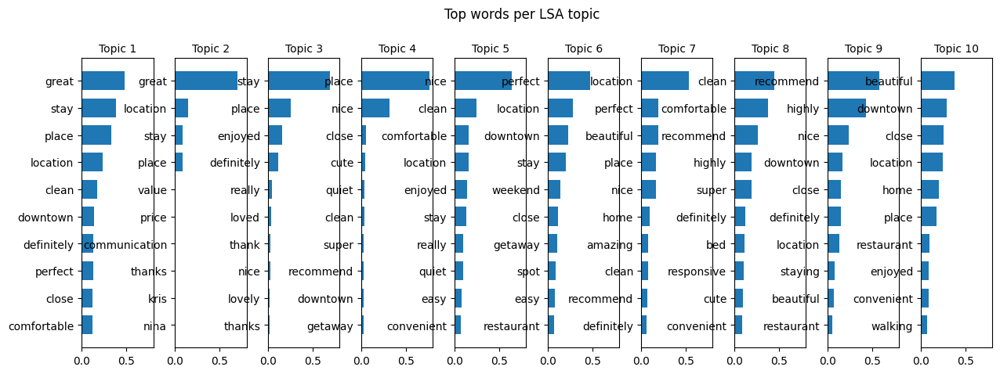

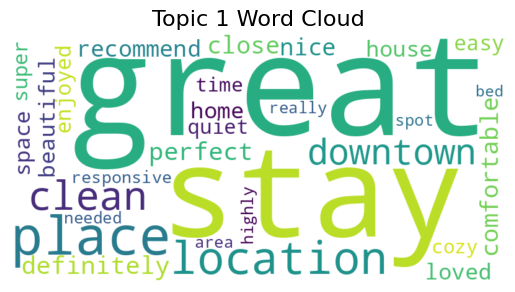

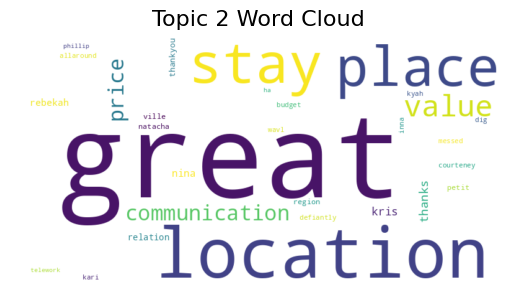

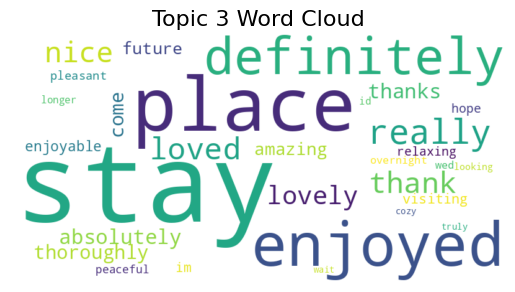

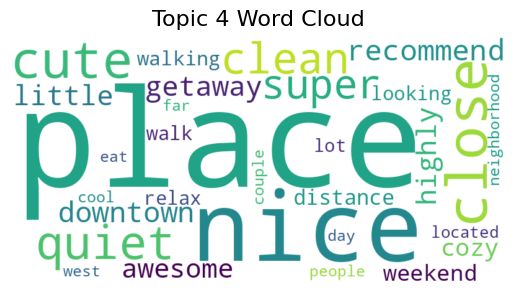

...

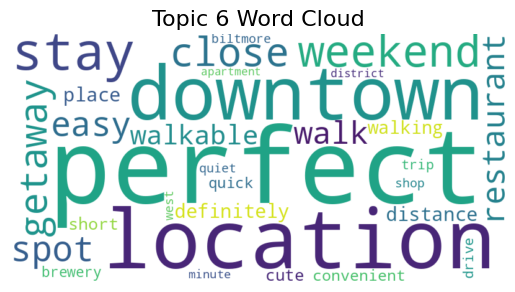

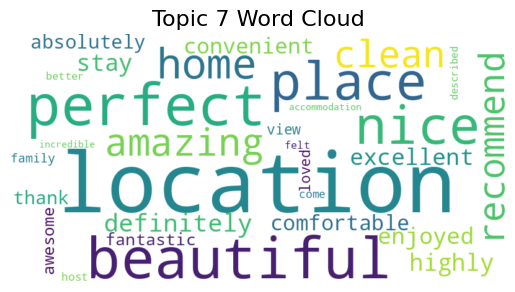

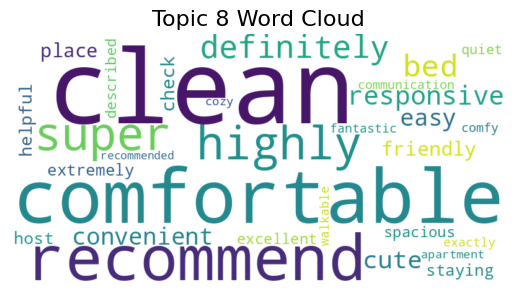

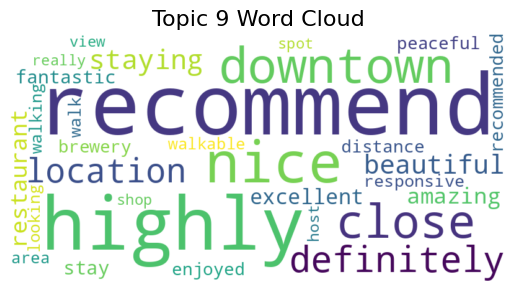

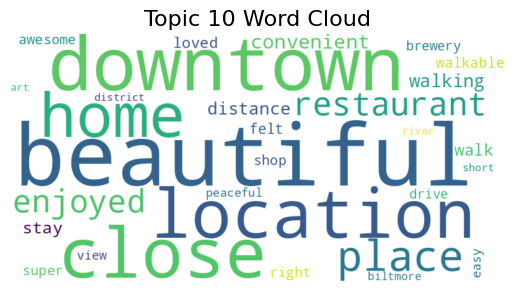

In [ ]:
# LSA Topic Plots
plot_top_words(lsa_model_post, terms, n_top_words=10, title='Top words per LSA topic')
plot_word_clouds(lsa_model_post, terms)



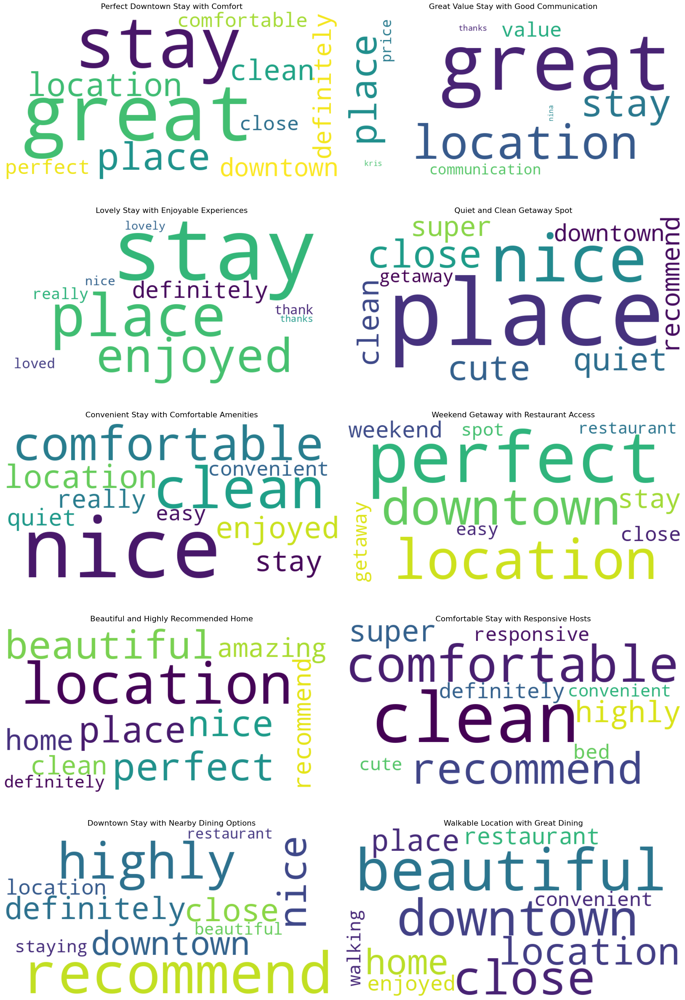

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Ensure plots render inline if using Jupyter Notebook
%matplotlib inline

# Labels for post-pandemic LSA topics
post_pandemic_lsa_labels = [
    "Perfect Downtown Stay with Comfort",
    "Great Value Stay with Good Communication",
    "Lovely Stay with Enjoyable Experiences",
    "Quiet and Clean Getaway Spot",
    "Convenient Stay with Comfortable Amenities",
    "Weekend Getaway with Restaurant Access",
    "Beautiful and Highly Recommended Home",
    "Comfortable Stay with Responsive Hosts",
    "Downtown Stay with Nearby Dining Options",
    "Walkable Location with Great Dining"
]

# Function to generate word clouds for LSA topics
def plot_word_clouds_with_labels(model, feature_names, labels, n_top_words=10):
    fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))  # Create a 5x2 grid
    axes = axes.flatten()  # Flatten the grid for easy access

    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = {feature_names[i]: topic[i] for i in top_features_ind}

        # Generate the word cloud for each topic
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_features)

        # Plot the word cloud
        axes[topic_idx].imshow(wordcloud, interpolation='bilinear')
        axes[topic_idx].axis('off')  # Hide axes
        axes[topic_idx].set_title(labels[topic_idx], fontsize=16)  # Add topic label

    plt.tight_layout()  # Adjust layout to avoid overlap
    plt.show()  # Display all plots

# Ensure the LSA model and vectorizer are defined and trained correctly
plot_word_clouds_with_labels(lsa_model_post, vectorizer.get_feature_names_out(), post_pandemic_lsa_labels, n_top_words=10)


In [ ]:
#Let's check the topic distance

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Function to plot topic distances using PCA
def plot_topic_distance_pca(model, title='Topic Distance (PCA)'):

    topic_word_matrix = model.components_


    pca = PCA(n_components=2)
    topic_pca = pca.fit_transform(topic_word_matrix)

    # Plot the topics in 2D space
    plt.figure(figsize=(8, 6))
    plt.scatter(topic_pca[:, 0], topic_pca[:, 1], c='blue', edgecolor='k', s=100)

    # Annotate the topics with text labels
    for i in range(len(topic_pca)):
        plt.text(topic_pca[i, 0], topic_pca[i, 1], f'Topic {i+1}', fontsize=12)

    plt.title(title)
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.show()

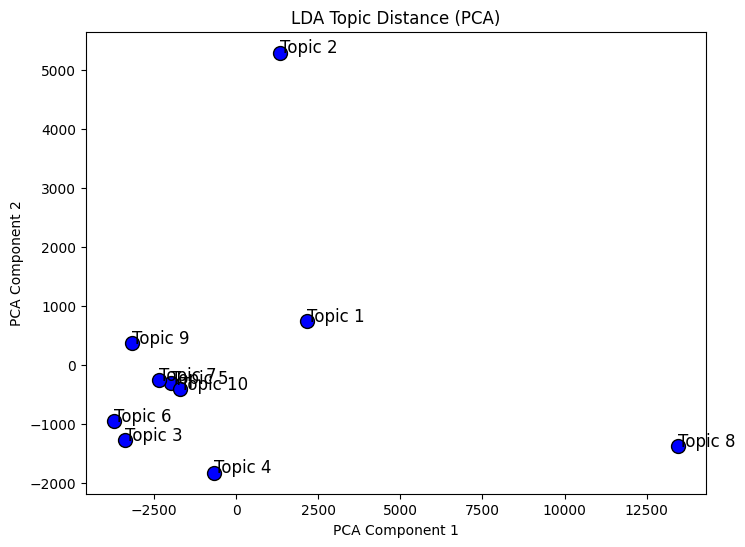

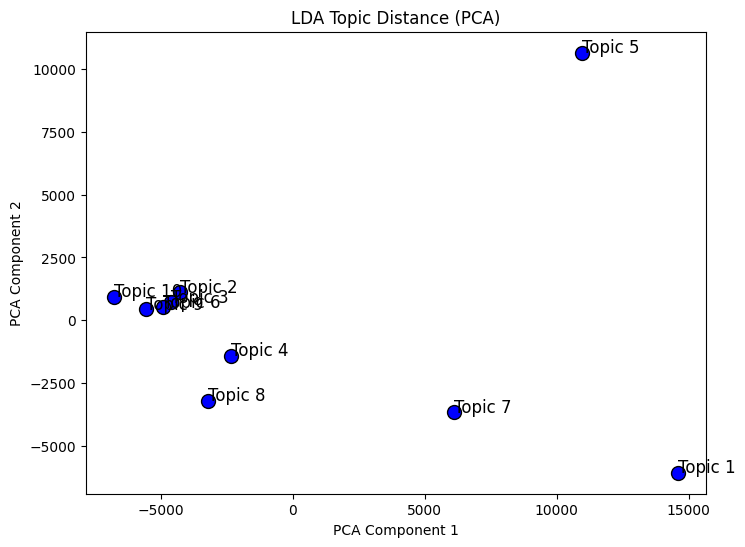

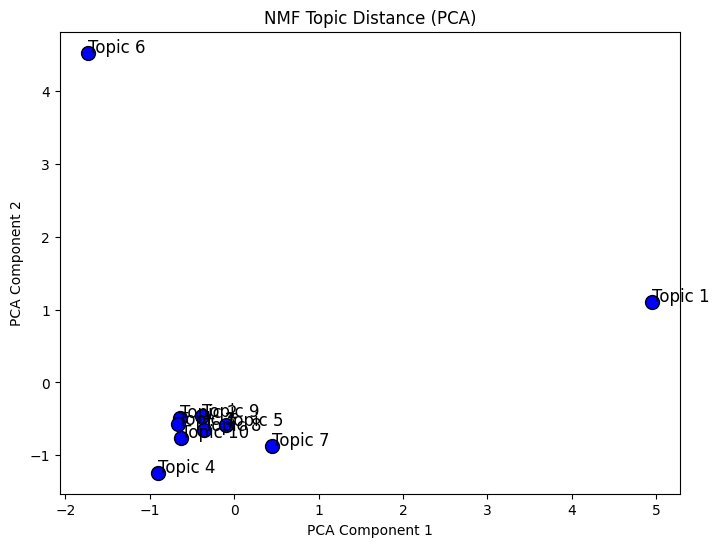

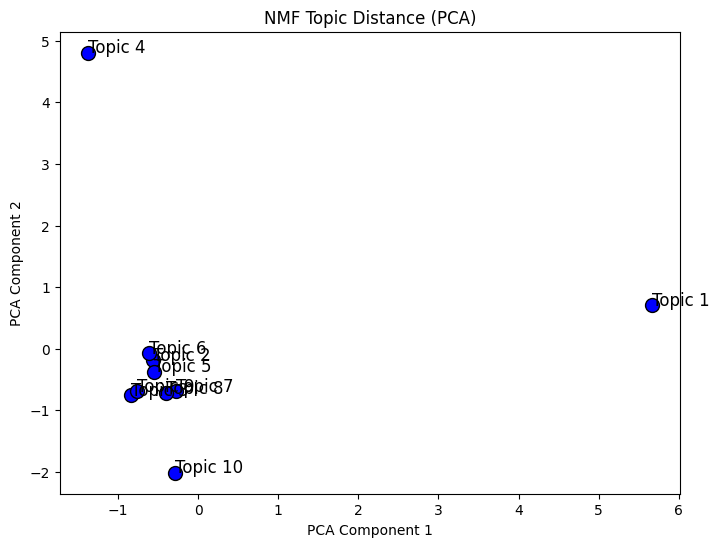

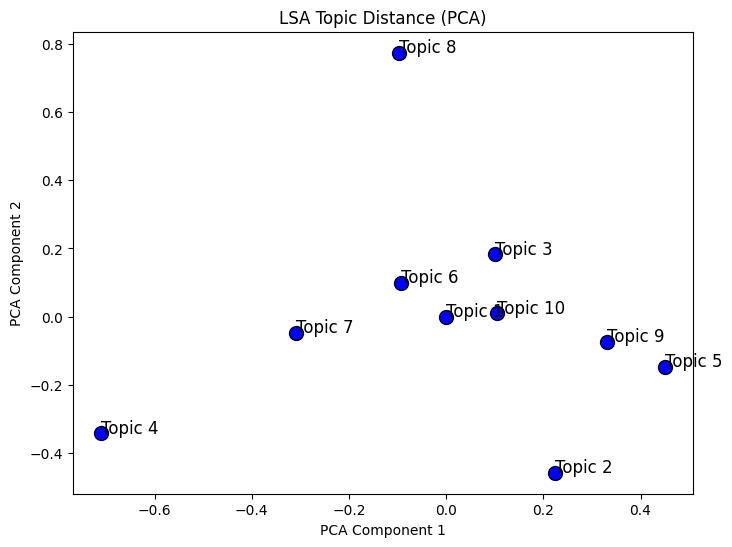

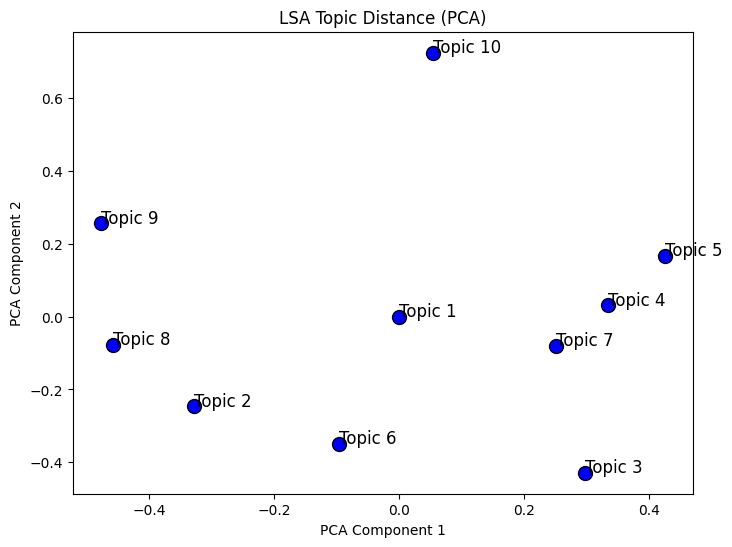

In [ ]:
# compare topic distance of all models
!pip install scikit-learn matplotlib
# LDA
from sklearn.decomposition import NMF
from sklearn.decomposition import TruncatedSVD
plot_topic_distance_pca(lda_model_pre, title='LDA Topic Distance (PCA)')
plot_topic_distance_pca(lda_model_post, title='LDA Topic Distance (PCA)')
# NMF
plot_topic_distance_pca(nmf_model_pre, title='NMF Topic Distance (PCA)')
plot_topic_distance_pca(nmf_model_post, title='NMF Topic Distance (PCA)')
# LSA
plot_topic_distance_pca(lsa_model_pre, title='LSA Topic Distance (PCA)')
plot_topic_distance_pca(lsa_model_post, title='LSA Topic Distance (PCA)')


**BERT**  
This part of the code is optional.

In [37]:
!pip install bertopic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.7/143.7 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 67.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.8/255.8 kB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.5 MB/s eta 0:00:00


**Available Pre-trained Models:**
You can find various pre-trained models on Hugging Face’s model hub, such as:

*   BERT (bert-base-uncased)
*   RoBERTa (roberta-base)
*   DistilBERT (distilbert-base-nli-stsb-mean-tokens)
*   Sentence-BERT (all-MiniLM-L6-v2, paraphrase-MiniLM-L12-v2, etc.)


BERTopic uses "all-MiniLM-L6-v2" by default, a lightweight sentence transformer model. You can use any pre-trained transformer model by loading it via SentenceTransformer and passing it to BERTopic.


e.g.,

*from sentence_transformers import SentenceTransformer*

*custom_embedding_model = SentenceTransformer('paraphrase-MiniLM-L6-v2')*



In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Let's sample a small subset of data for the class demostration purpose. If you use it in the assignment, please use the full dataset.
#sampled_reviews = pre_pandemic_reviews.sample(n=500, random_state=42)

# Prepare the text data for BERTopic
texts = pre_pandemic_reviews['cleaned_comments'].tolist()

# Use a different embedding model
embedding_model_pre = SentenceTransformer("paraphrase-MiniLM-L12-v2")

# Fit the BERTopic model
topic_model = BERTopic(verbose=True, embedding_model=embedding_model_pre, min_topic_size = 50) # min topic size would help to merge smaller topics into broder categories
topics, probabilities = topic_model.fit_transform(texts)

# Reduce the number of topics to a maximum of 15
topic_model_pre = topic_model.reduce_topics(texts, nr_topics=20)

# Get topic information
topic_info = topic_model.get_topic_info()
print(topic_info)

2024-10-20 20:59:18,117 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1122 [00:00<?, ?it/s]

2024-10-20 21:17:34,612 - BERTopic - Embedding - Completed ✓
2024-10-20 21:17:34,614 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-10-20 21:18:51,486 - BERTopic - Dimensionality - Completed ✓
2024-10-20 21:18:51,489 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-10-20 21:19:00,537 - BERTopic - Cluster - Completed ✓
2024-10-20 21:19:00,570 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-10-20 21:19:01,904 - BERTopic - Representation - Completed ✓
2024-10-20 21:19:02,869 - BERTopic - Topic reduction - Reducing number of topics
2024-10-20 21:19:04,218 - BERTopic - Topic reduction - Reduced number of topics from 78 to 20


    Topic  Count                                   Name  \
0      -1  15650           -1_place_stay_great_location   
1       0   6555           0_bed_great_stay_comfortable   
2       1   5926        1_downtown_great_place_location   
3       2   1387                2_dog_pup_yard_friendly   
4       3   1216              3_tub_hot_bathroom_shower   
5       4   1072           4_space_clean_location_great   
6       5    980            5_host_great_location_place   
7       6    838          6_stay_great_definitely_place   
8       7    501           7_great_location_place_price   
9       8    455       8_weekend_couple_perfect_getaway   
10      9    341               9_airbnbs_air_bnb_stayed   
11     10    193          10_great_de_thanks_everything   
12     11    191             11_fire_pit_camper_camping   
13     12    113           12_traci_staci_stacis_tracis   
14     13    106         13_checkin_check_easy_checkout   
15     14    105                  14_na_ok_defines_thnx 

In [ ]:
# Visualize the word distribution for the topics
topic_model.visualize_barchart(top_n_topics=20, height=200)

In [ ]:
# Visualize the hierarchical clustering of topics
topic_model.visualize_hierarchy()

In [ ]:
# Visualize the topic similarity using a heatmap
topic_model.visualize_heatmap()

In [ ]:
# visualize intertopic distance
topic_model.visualize_topics()
